# Importing the necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Loading dataset

In [2]:
df=pd.read_csv('Datasets/Employee_Attrition_Data.csv')

# Data Exploration and Initial Exploration

In [3]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
df.shape


(1470, 35)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

# removing the constant features

In [6]:
constant_features = [col for col in df.columns if df[col].nunique() == 1]
constant_features

['EmployeeCount', 'Over18', 'StandardHours']

In [7]:
df = df.drop(columns=constant_features)
print("Removed constant features:", constant_features)


Removed constant features: ['EmployeeCount', 'Over18', 'StandardHours']


# Describing summary of the datasets

In [8]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


# Vision over columns in the dataset

In [9]:
list(df.columns)

['Age',
 'Attrition',
 'BusinessTravel',
 'DailyRate',
 'Department',
 'DistanceFromHome',
 'Education',
 'EducationField',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'Gender',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

# Finding the missing values

In [10]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

# Listing the categorical and numerical columns

In [11]:
categorical_columns=df.select_dtypes(include=['category','object']).columns
numerical_columns=df.select_dtypes(exclude=['category','object']).columns



# There are no missing columns

In [12]:
df[categorical_columns].isnull().sum()

Attrition         0
BusinessTravel    0
Department        0
EducationField    0
Gender            0
JobRole           0
MaritalStatus     0
OverTime          0
dtype: int64

In [13]:
df[numerical_columns].isnull().sum()

Age                         0
DailyRate                   0
DistanceFromHome            0
Education                   0
EmployeeNumber              0
EnvironmentSatisfaction     0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobSatisfaction             0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

# Plotting Boxplot of numerical columns

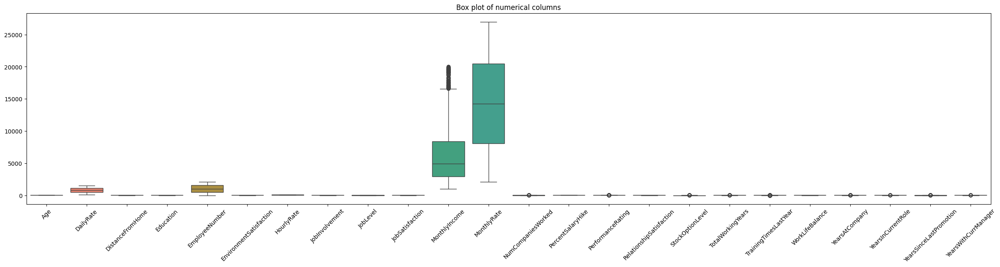

In [14]:
plt.figure(figsize=(30,6))
sns.boxplot(data=df[numerical_columns])
plt.xticks(rotation=45)
plt.title('Box plot of numerical columns')
plt.show()

#### To determine whether numerical columns follow a normal distribution, you can perform statistical tests or visual inspections. Normal distribution, also known as Gaussian distribution, is characterized by a bell-shaped curve where the data cluster around the mean, with most values close to the mean and fewer values farther away.

In [15]:
import scipy.stats as stats

# Create a figure and axes for subplots


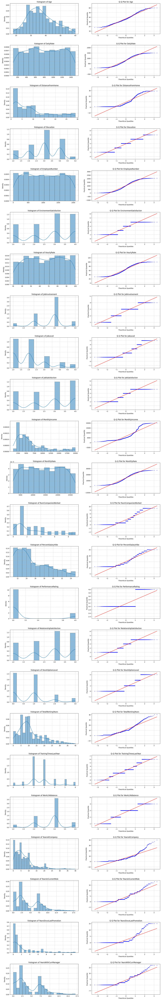

In [16]:
num_cols=len(numerical_columns)
fig, axes= plt.subplots(num_cols, 2, figsize=(16, num_cols*4))

# plotting histogram and Q-Q plots for each numerical column

for i, col in enumerate(numerical_columns):
        #Hitogram on the left subplot
    sns.histplot(df[col], kde=True, ax=axes[i,0], stat='density', linewidth=0.5)
    axes[i,0].set_title(f'histogram of {col}')
    axes[i,0].set_xlabel('')
    axes[i,0].set_ylabel('Density')
    axes[i,0].grid(True, linestyle='--', alpha=0.7)

    #Q-Q plot on the right subplot
    stats.probplot(df[col], plot=axes[i,1], dist='norm', fit=True)
    axes[i,1].get_lines()[0].set_markersize(2.0)
    axes[i,1].grid(True,linestyle='--', alpha=0.7)
    axes[i,1].set_title(f'Q-Q Plot for {col}')
    axes[i,1].set_xlabel('Theoritical Quantiles')
    axes[i,1].set_ylabel('Practical Quantile')
plt.tight_layout(pad=3.0)
plt.show()


#### Statistical Tests: Use statistical methods such as the Shapiro-Wilk test or Kolmogorov-Smirnov test. These tests evaluate whether a sample of data comes from a normal distribution. If the p-value from these tests is greater than a chosen significance level (e.g., 0.05), it suggests that the data may follow a normal distribution. 
#### Descriptive Statistics: Calculate descriptive statistics such as mean, median, and standard deviation. For normally distributed data, the mean and median are typically close in value, and about 68% of the data falls within one standard deviation of the mean, 95% within two standard deviations, and 99.7% within three standard deviations.

In [17]:
from scipy.stats import anderson, jarque_bera, shapiro, normaltest, kstest
from statsmodels.stats.diagnostic import lilliefors 

# Function to perform normality tests

In [18]:
def test_normality(df, col):
    print(f'Column: {col}')
    
    # Shapiro-Wilk test
    stat_shapiro, p_shapiro = shapiro(df[col])
    print(f'Shapiro-Wilk Test: Statistics={stat_shapiro:.3f}, p-value={p_shapiro:.3f}')
    if p_shapiro > 0.05:
        print(f'Shapiro-Wilk Test: {col} looks normally distributed (fail to reject H0)')
    else:
        print(f'Shapiro-Wilk Test: {col} does not look normally distributed (reject H0)')
    
    # Anderson-Darling test
    result_anderson = anderson(df[col])
    print(f'Anderson-Darling Test: Statistics={result_anderson.statistic:.3f}')
    print(f'Anderson-Darling Test: Critical Values: {result_anderson.critical_values}')
    if result_anderson.statistic < result_anderson.critical_values[2]:
        print(f'Anderson-Darling Test: {col} looks normally distributed (fail to reject H0)')
    else:
        print(f'Anderson-Darling Test: {col} does not look normally distributed (reject H0)')
    
    # Jarque-Bera test
    jb_stat, p_val_jb = jarque_bera(df[col])
    print(f'Jarque-Bera Test: JB statistic={jb_stat:.3f}, p-value={p_val_jb:.3f}')
    if p_val_jb > 0.05:
        print(f'Jarque-Bera Test: {col} looks normally distributed (fail to reject H0)')
    else:
        print(f'Jarque-Bera Test: {col} does not look normally distributed (reject H0)')


# D'Agostino and Pearson's test
    stat_agostino, p_agostino = normaltest(df[col])
    print(f"D'Agostino and Pearson's Test: Statistics={stat_agostino:.3f}, p-value={p_agostino:.3f}")
    if p_agostino > 0.05:
        print(f"D'Agostino and Pearson's Test: {col} looks normally distributed (fail to reject H0)")
    else:
        print(f"D'Agostino and Pearson's Test: {col} does not look normally distributed (reject H0)")
    
    # Kolmogorov-Smirnov test
    ks_stat, p_ks = kstest(df[col], 'norm')
    print(f'Kolmogorov-Smirnov Test: KS statistic={ks_stat:.3f}, p-value={p_ks:.3f}')
    if p_ks > 0.05:
        print(f'Kolmogorov-Smirnov Test: {col} looks normally distributed (fail to reject H0)')
    else:
        print(f'Kolmogorov-Smirnov Test: {col} does not look normally distributed (reject H0)')
    
    # Lilliefors test
    stat_lilliefors, p_lilliefors = lilliefors(df[col])
    print(f'Lilliefors Test: Statistics={stat_lilliefors:.3f}, p-value={p_lilliefors:.3f}')
    if p_lilliefors > 0.05:
        print(f'Lilliefors Test: {col} looks normally distributed (fail to reject H0)')
    else:
        print(f'Lilliefors Test: {col} does not look normally distributed (reject H0)')
    
    print('\n')

# Perform normality tests for each numerical column
for col in numerical_columns:
    test_normality(df, col)

Column: Age
Shapiro-Wilk Test: Statistics=0.977, p-value=0.000
Shapiro-Wilk Test: Age does not look normally distributed (reject H0)
Anderson-Darling Test: Statistics=9.969
Anderson-Darling Test: Critical Values: [0.574 0.654 0.785 0.916 1.089]
Anderson-Darling Test: Age does not look normally distributed (reject H0)
Jarque-Bera Test: JB statistic=51.901, p-value=0.000
Jarque-Bera Test: Age does not look normally distributed (reject H0)
D'Agostino and Pearson's Test: Statistics=54.684, p-value=0.000
D'Agostino and Pearson's Test: Age does not look normally distributed (reject H0)
Kolmogorov-Smirnov Test: KS statistic=1.000, p-value=0.000
Kolmogorov-Smirnov Test: Age does not look normally distributed (reject H0)
Lilliefors Test: Statistics=0.083, p-value=0.001
Lilliefors Test: Age does not look normally distributed (reject H0)


Column: DailyRate
Shapiro-Wilk Test: Statistics=0.954, p-value=0.000
Shapiro-Wilk Test: DailyRate does not look normally distributed (reject H0)
Anderson-Darli

### doesnot look normally distributed, so uses IQR method

## Function to detect outliers using IQR method 

In [19]:
def find_outliers_iqr(data):
    outliers_mask = pd.Series(index=data.columns, dtype=bool)
    
    for col in data.columns: # process only numerical columns
        if col in numerical_columns:
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            col_outliers_mask = (data[col] < lower_bound) | (data[col] > upper_bound)
            outliers_mask[col] =  col_outliers_mask.any() # True if any outliers detected
            
    return outliers_mask
    
outliers_iqr_mask = find_outliers_iqr(df)
print("Outliers detected using IQR method")
for col, is_outlier in outliers_iqr_mask.items():
    print(f" {col}: {is_outlier}")

Outliers detected using IQR method
 Age: False
 Attrition: True
 BusinessTravel: True
 DailyRate: False
 Department: True
 DistanceFromHome: False
 Education: False
 EducationField: True
 EmployeeNumber: False
 EnvironmentSatisfaction: False
 Gender: True
 HourlyRate: False
 JobInvolvement: False
 JobLevel: False
 JobRole: True
 JobSatisfaction: False
 MaritalStatus: True
 MonthlyIncome: True
 MonthlyRate: False
 NumCompaniesWorked: True
 OverTime: True
 PercentSalaryHike: False
 PerformanceRating: True
 RelationshipSatisfaction: False
 StockOptionLevel: True
 TotalWorkingYears: True
 TrainingTimesLastYear: True
 WorkLifeBalance: False
 YearsAtCompany: True
 YearsInCurrentRole: True
 YearsSinceLastPromotion: True
 YearsWithCurrManager: True


# Function to remove outliers using IQR method


In [20]:
def remove_outliers_iqr(data):
    cleaned_data = data.copy()

    for col in data.columns:
        if col in numerical_columns:  # Process only numerical columns
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            cleaned_data = cleaned_data[(cleaned_data[col] >= lower_bound) & (cleaned_data[col] <= upper_bound)]

    return cleaned_data

cleaned_data_iqr = remove_outliers_iqr(df)
print("DataFrame after removing outliers using IQR method:")
print(cleaned_data_iqr)

DataFrame after removing outliers using IQR method:
      Age Attrition     BusinessTravel  DailyRate              Department  \
2      37       Yes      Travel_Rarely       1373  Research & Development   
3      33        No  Travel_Frequently       1392  Research & Development   
5      32        No  Travel_Frequently       1005  Research & Development   
9      36        No      Travel_Rarely       1299  Research & Development   
11     29        No      Travel_Rarely        153  Research & Development   
...   ...       ...                ...        ...                     ...   
1463   31        No         Non-Travel        325  Research & Development   
1464   26        No      Travel_Rarely       1167                   Sales   
1465   36        No  Travel_Frequently        884  Research & Development   
1468   49        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      DistanceFromHome 

# Exploratory Data Analysis

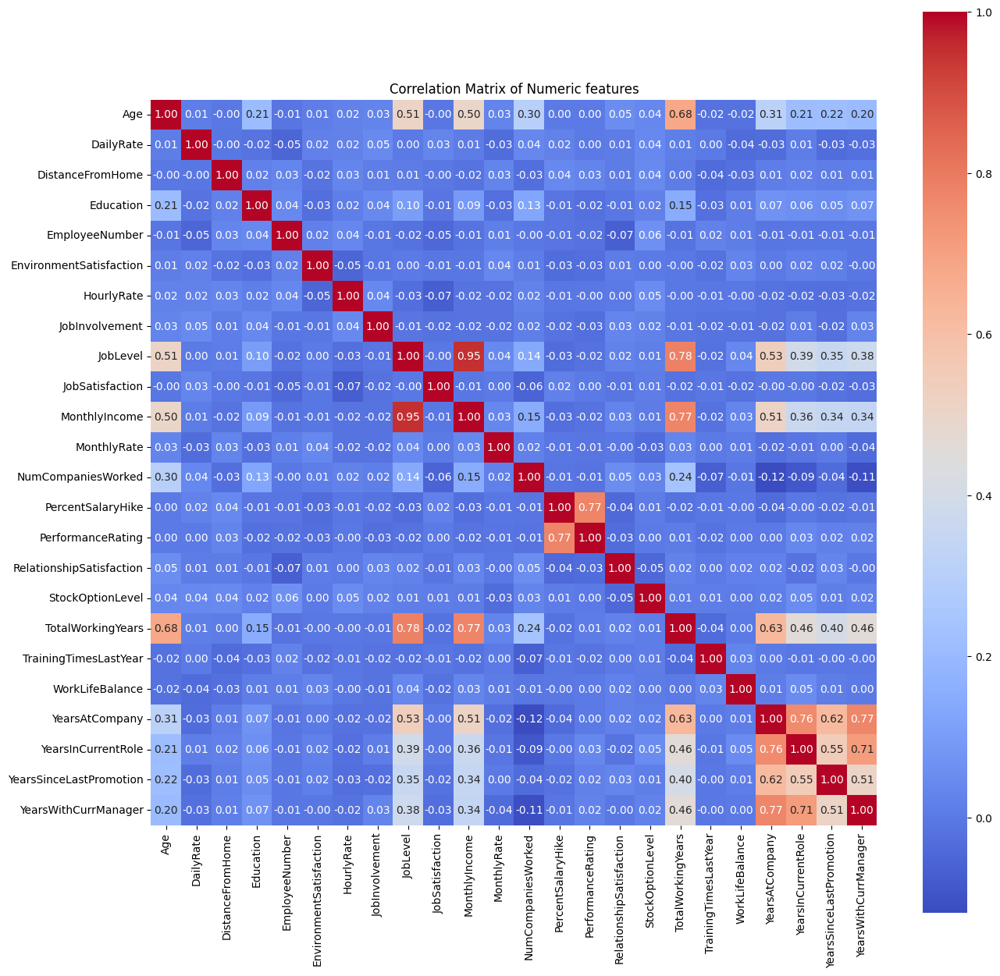

In [21]:
numeric_data = df[numerical_columns]

# computer partwise xonnections of numeric columns
correlation_matrix = numeric_data.corr()

#plotting correlation heatmap
plt.figure(figsize=(15,15))
sns.heatmap(correlation_matrix, annot= True, cmap='coolwarm', fmt=".2f", square= True)
plt.title('Correlation Matrix of Numeric features')
plt.show()

# Pair plot of numerical values


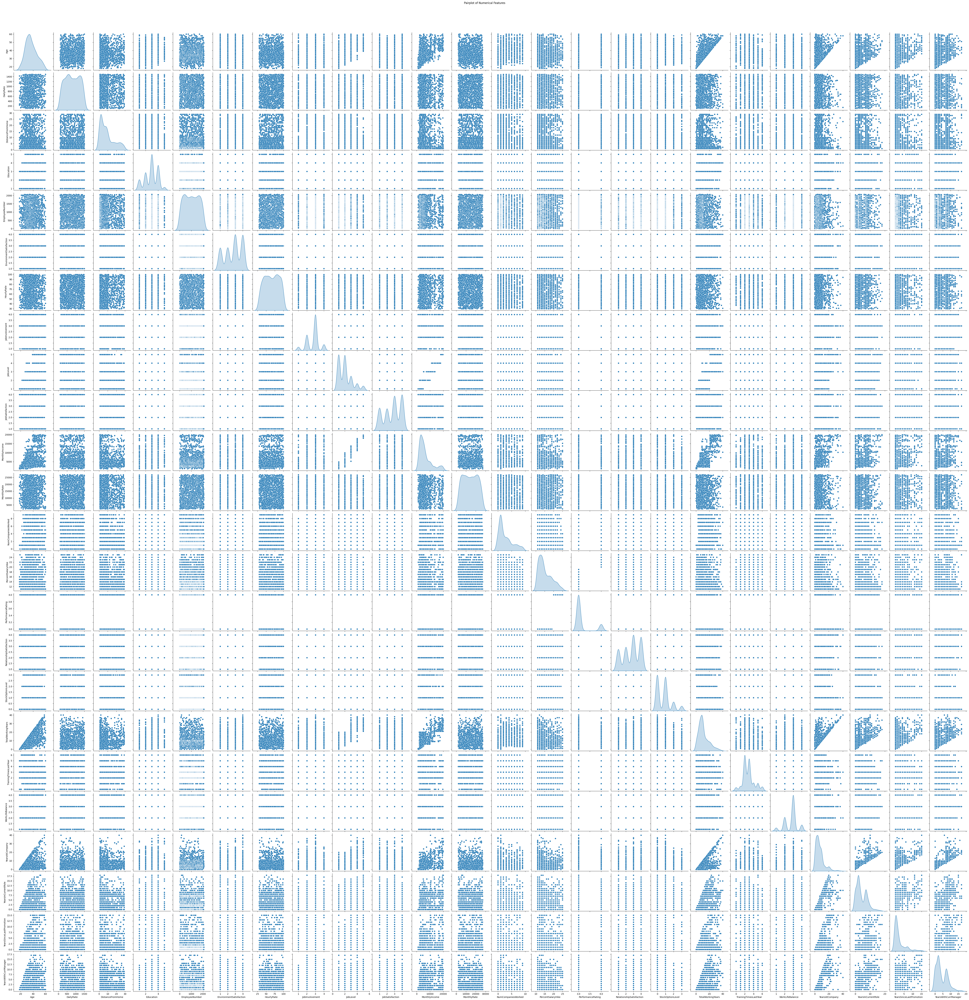

In [22]:
sns.pairplot(df[numerical_columns],diag_kind='kde')
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

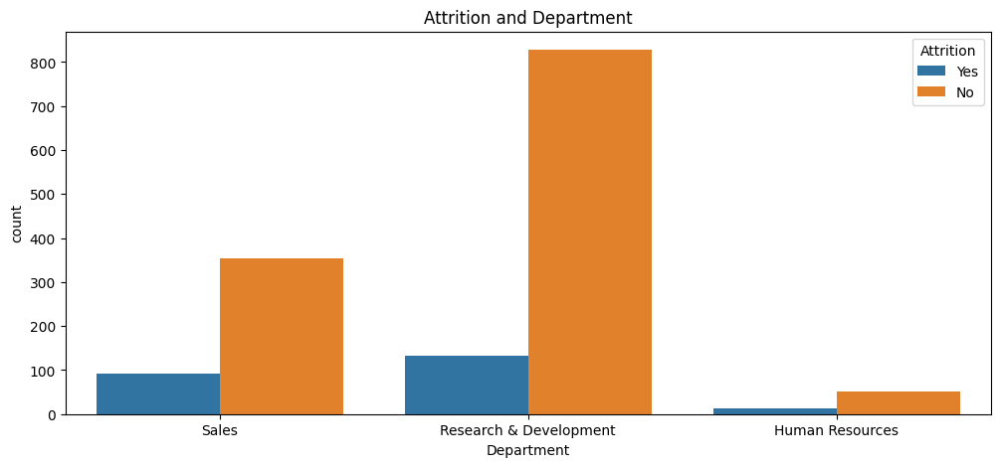

In [26]:
plt.figure(figsize=(12,5))
sns.countplot(x='Department', hue='Attrition', data=df)
plt.title("Attrition and Department")
plt.show()

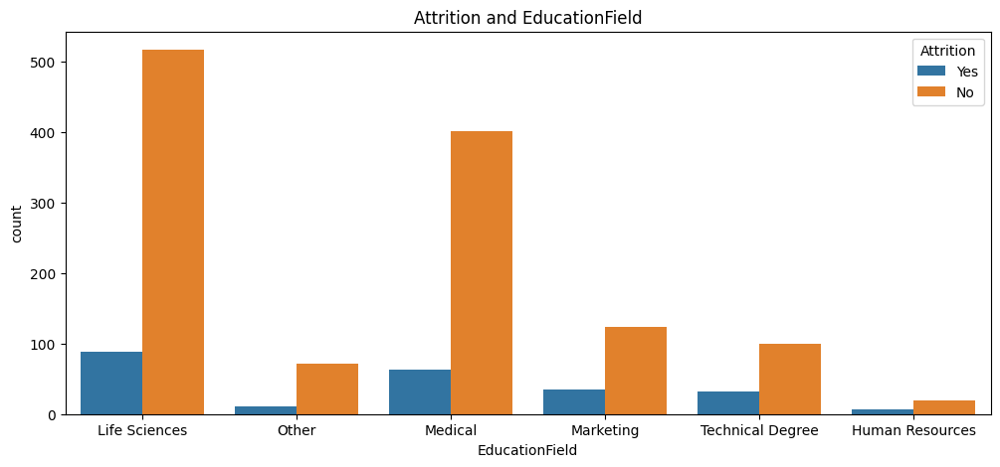

In [28]:
plt.figure(figsize=(12,5))
sns.countplot(x='EducationField', hue='Attrition', data=df)
plt.title("Attrition and EducationField")
plt.show()

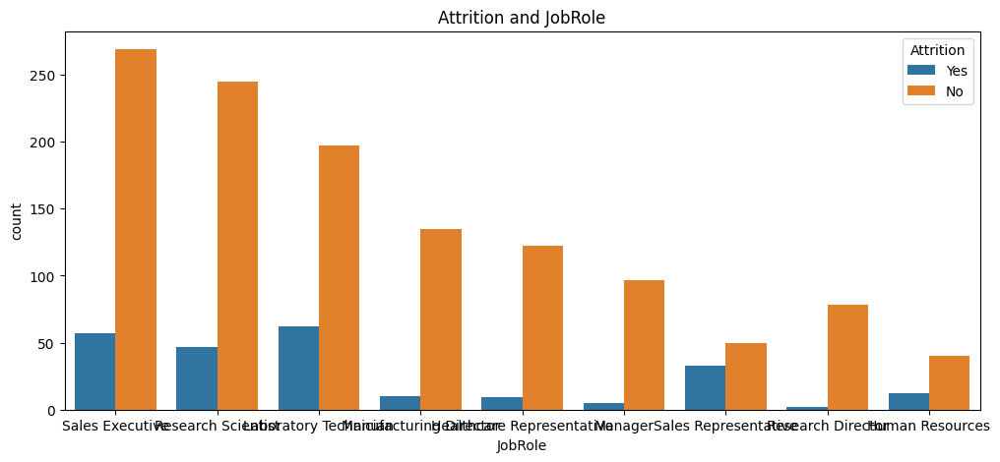

In [29]:
plt.figure(figsize=(12,5))
sns.countplot(x='JobRole', hue='Attrition', data=df)
plt.title("Attrition and JobRole")
plt.show()

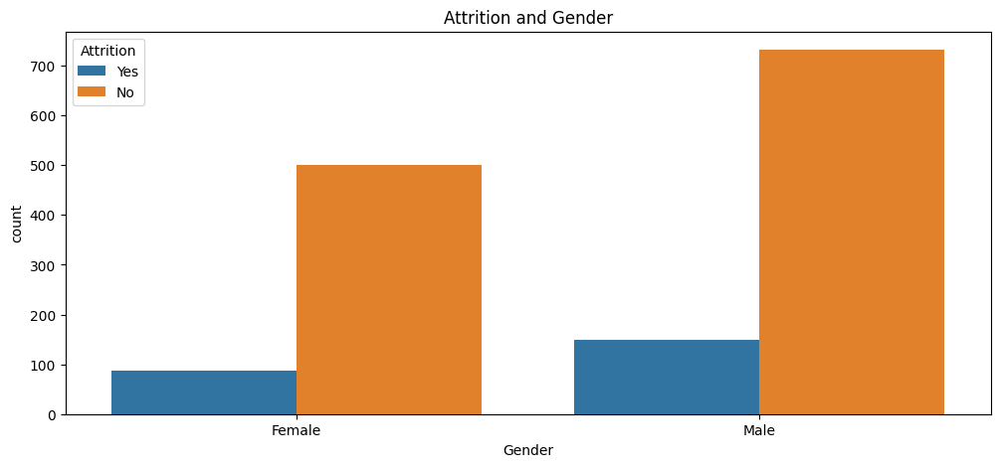

In [30]:
plt.figure(figsize=(12,5))
sns.countplot(x='Gender', hue='Attrition', data=df)
plt.title("Attrition and Gender")
plt.show()

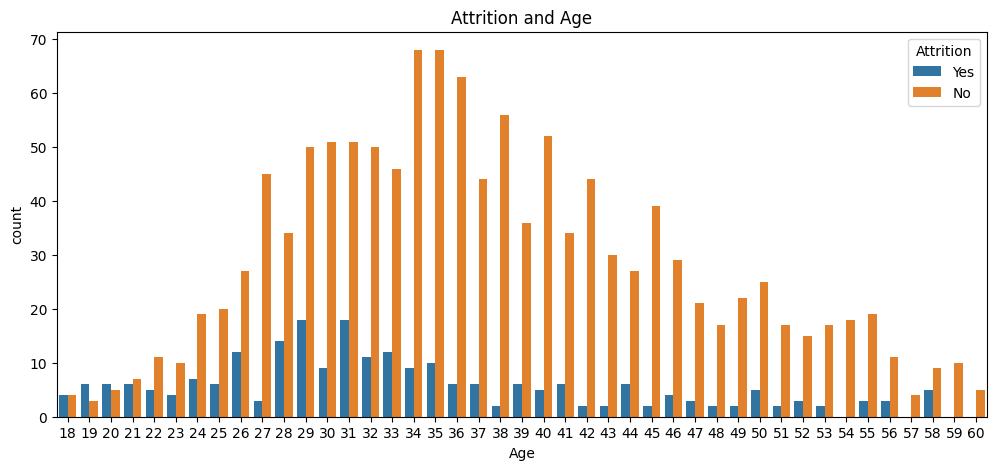

In [31]:
plt.figure(figsize=(12,5))
sns.countplot(x='Age', hue='Attrition', data=df)
plt.title("Attrition and Age")
plt.show()

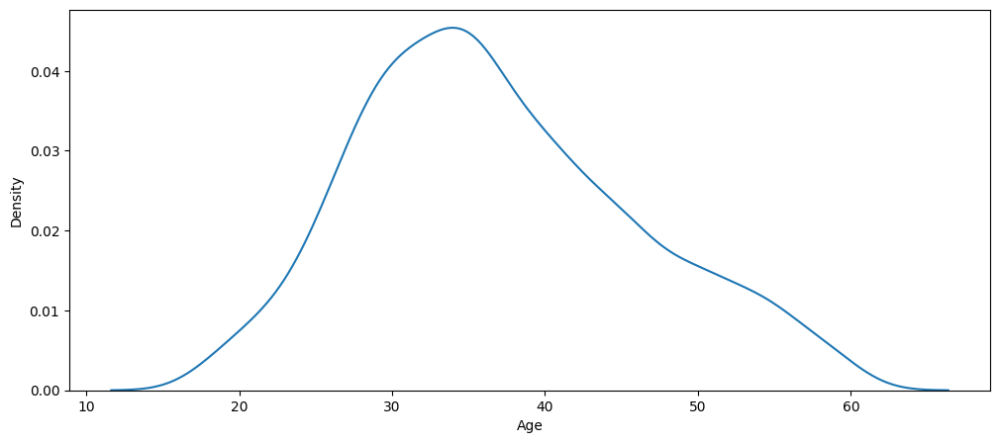

In [37]:
plt.figure(figsize=(12,5))
sns.kdeplot(df['Age'])
plt.show()

In [39]:
df.to_csv('Datasets/filtered_data.csv', index=False)

# Loading and Working with the filtered data sets

In [40]:
data = pd.read_csv("Datasets/filtered_data.csv")

In [41]:
df.head(60)


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,3,4,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,8,4,...,3,3,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,10,3,...,4,1,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,11,4,...,4,2,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,12,4,...,4,2,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,13,3,...,3,2,2,17,3,2,7,7,7,7


In [42]:
ordinal_features = ['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobSatisfaction',
                    'PerformanceRating', 'RelationshipSatisfaction', 'WorkLifeBalance']
data[ordinal_features].head()

,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance
0,2,2,3,4,3,1,1
1,1,3,2,2,4,4,3
2,2,4,2,3,3,2,3
3,4,4,3,3,3,3,3
4,1,1,3,2,3,4,3


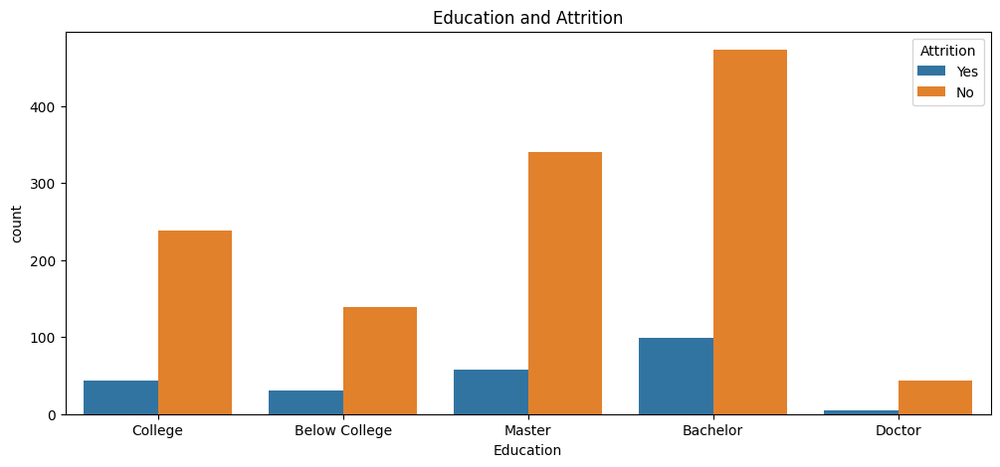

In [43]:
edu_map={1:'Below College', 2: 'College', 3:'Bachelor', 4:'Master', 5:'Doctor'}
plt.figure(figsize=(12,5))
sns.countplot(x=df['Education'].map(edu_map), hue='Attrition', data=df)
plt.title("Education and Attrition")
plt.show()

# Label Encoding